In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math
from scipy.sparse import random
from scipy import stats
from numpy.random import default_rng
import time
import pywt

In [2]:
n_rows_w = 500
n_cols_w = 10
n_cols_h = 1000

#generate W: 500 x 10, H: 10 x 1000
W = np.random.normal(loc = 0, scale = 1, size = (n_rows_w, n_cols_w))
H = np.random.normal(loc = 0, scale = 1, size = (n_cols_w, n_cols_h))
L_0 = np.dot(W,H)

#generate 500 x 1000 sparse matrix with 0.05mn non zero entries
S_0 = random(500,1000, density = 0.05, format = 'csr')

In [34]:
def svd_threshold(M, tau):
    U, S, V = np.linalg.svd(M, full_matrices=False)
    return np.dot(U, np.dot(np.diag(shrink(S, tau)), V))

def frobenius_norm(M):
    return np.linalg.norm(M, ord='fro')

def shrink(M, tau):
    #return np.multiply(np.sign(M), np.maximum((np.abs(M) - tau), np.zeros(M.shape)))
    return pywt.threshold(M, tau, 'soft')


def fit_rpca(M ,n_rows_w, n_cols_h):
    
    lmbda=1/(np.sqrt(max(n_rows_w,n_cols_h)))
    mu = 0.1
    mu_inv = 1/mu
    t = 1
    
    itera = 0
    Sk = np.random.normal(loc = 0, scale = 1, size = (M.shape))
    Zk = np.random.normal(loc = 0, scale = 1, size = (M.shape))
    Lk = np.random.normal(loc = 0, scale = 1, size = (M.shape))
    err = np.Inf
    
    starttime = time.time()
    while err > 10**(-4) and itera <100:
        L_kminus1 =  Lk
        S_kminus1 = Sk
        Lk = svd_threshold(M - Sk - mu_inv * Zk, mu_inv)  
        Sk = shrink((M - Lk - mu_inv * Zk), mu_inv * lmbda)
        Zk = Zk + t*mu*(Lk + Sk - M)
        err = max(frobenius_norm(Lk - L_kminus1)/(1+frobenius_norm(Lk)),frobenius_norm(Sk - S_kminus1)/(1+frobenius_norm(Sk)))
        itera += 1
    elapsed = time.time() - starttime
    
    return Lk, Sk, itera, elapsed, err

In [35]:
M = L_0 + S_0
L, S, i, elapsed, err = fit_rpca(M ,n_rows_w, n_cols_h)

In [36]:
# frobenius norm (L - L_0)
deltaL = frobenius_norm(L - L_0)
# frobenius norm (S - S_0)
deltaS = frobenius_norm(S - S_0)

In [37]:
print("frob_norm(L-L_0) : {} \nfrob_norm(S-S_0) : {} \nnumber of iterations : {} \nelapsed time : {}s".
      format(round(deltaL,4), round(deltaS,4), i, round(elapsed,2)))

frob_norm(L-L_0) : 0.0123 
frob_norm(S-S_0) : 0.0618 
number of iterations : 59 
elapsed time : 6.69s


### Tune parameter σ in every iteration 

In [11]:
def fit_rpca_tuned(M ,n_rows_w, n_cols_h):
    
    lmbda=1/(np.sqrt(max(n_rows_w,n_cols_h)))
    t = 1
    U, S, V = np.linalg.svd(M, full_matrices=False)
    mu = 1/(max(np.array(S).flatten()))
    rho = 1.1
    
    itera = 0
    Sk = np.random.normal(loc = 0, scale = 1, size = (M.shape))
    Zk = np.random.normal(loc = 0, scale = 1, size = (M.shape))
    Lk = np.random.normal(loc = 0, scale = 1, size = (M.shape))
    muk = mu
    err = np.Inf
    
    starttime = time.time()
    while err > 10**(-4):
        L_kminus1 =  Lk
        S_kminus1 = Sk
        Lk = svd_threshold(M - Sk - (1/muk) * Zk, 1/muk)  
        Sk = shrink((M - Lk - (1/muk) * Zk), (1/muk) * lmbda)
        Zk = Zk + t*muk*(Lk + Sk - M)
        muk = rho*muk
        err = max(frobenius_norm(Lk - L_kminus1)/(1+frobenius_norm(Lk)),frobenius_norm(Sk - S_kminus1)/(1+frobenius_norm(Sk)))
        itera += 1
    elapsed = time.time() - starttime
    
    return Lk, Sk, itera, elapsed, err

In [12]:
M = L_0 + S_0
L, S, i, elapsed, err = fit_rpca_tuned(M,n_rows_w, n_cols_h)

In [13]:
# frobenius norm (L - L_0)
deltaL = frobenius_norm(L - L_0)
# frobenius norm (S - S_0)
deltaS = frobenius_norm(S - S_0)

In [14]:
print("frob_norm(L-L_0) : {} \nfrob_norm(S-S_0) : {} \nnumber of iterations : {} \nelapsed time : {}s".
      format(round(deltaL,4), round(deltaS,4), i, round(elapsed,2)))

frob_norm(L-L_0) : 0.0035 
frob_norm(S-S_0) : 0.0125 
number of iterations : 74 
elapsed time : 7.34s


### Applying R_PCA to Basketball player video

In [38]:
df = pd.read_csv("BasketballPlayer.csv",header=None) 

In [39]:
basketball_M = df.to_numpy()

In [40]:
basketball_M.shape

(1261332, 112)

In [41]:
L, S, i, elapsed, err = fit_rpca_tuned(basketball_M,basketball_M.shape[0],basketball_M.shape[1])

In [42]:
print("frob_norm(L-L_0) : {} \nfrob_norm(S-S_0) : {} \nnumber of iterations : {} \nelapsed time : {}s".
      format(round(deltaL,4), round(deltaS,4), i, round(elapsed,2)))

frob_norm(L-L_0) : 0.0123 
frob_norm(S-S_0) : 0.0618 
number of iterations : 84 
elapsed time : 1363.83s


In [43]:
print("The Rank of a Matrix L: ", np.linalg.matrix_rank(L))

The Rank of a Matrix L:  45


In [44]:
print("The error rk: ", round(err,7))

The error rk:  9.12e-05


In [45]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from PIL import Image
import cv2

In [46]:
def minmaxscale(M):
    return (M - min(M)) / (max(M) - min(M))

def cv2plt(img):
    plt.figure(figsize=(10,10))        # To change the size of figure
    plt.axis('on')
    if np.size(img.shape) == 3:
        plt.imshow(img)
    else:
        plt.imshow(img,cmap='gray',vmin=0,vmax=255)  
    plt.show()
    
def rotate_image(image, angle):
    image_center = tuple(np.array(image.shape[1::-1]) / 2)
    rot_mat = cv2.getRotationMatrix2D(image_center, angle, 1.0)
    result = cv2.warpAffine(image, rot_mat, image.shape[1::-1], flags=cv2.INTER_LINEAR)
    return result

def transform(arr):
    arr = 255 * (arr)
    arr.resize((1374,918))
    arr = np.asarray(arr, dtype="uint8")
    img = cv2.cvtColor(arr, cv2.COLOR_GRAY2BGR)
    img = cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)
    return img

In [47]:
#20th column
L_20 = minmaxscale([sub[20] for sub in L])
S_20 = minmaxscale([sub[20] for sub in S])
M_20 = (L_20 + S_20)
M_20 = (L_20 + S_20) - (M_20.mean() - L_20.mean())

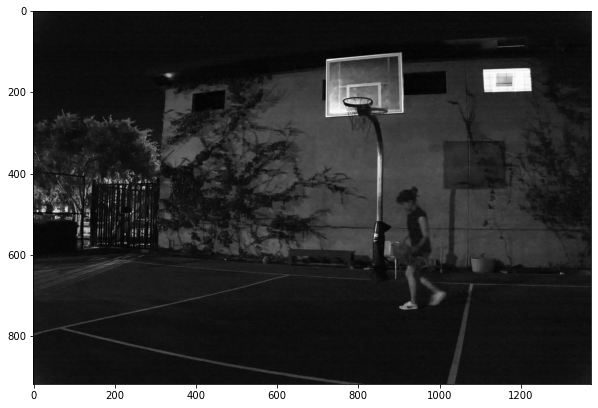

In [48]:
M_img = transform(M_20)
cv2plt(M_img)

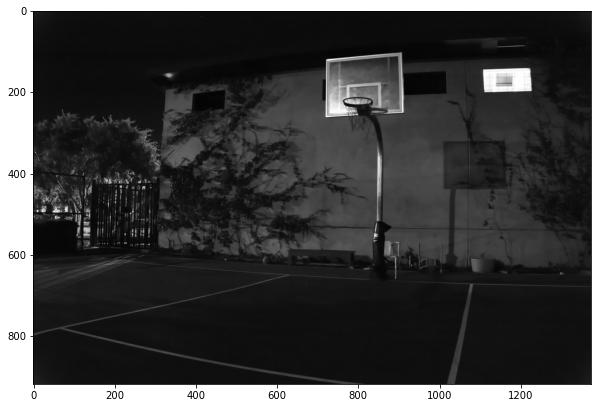

In [49]:
L_img = transform(np.array(L_20))
cv2plt(L_img)

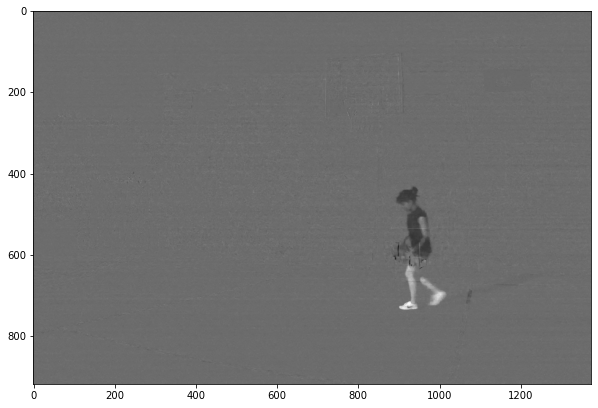

In [50]:
S_img = transform(np.array(S_20))
cv2plt(S_img)

In [51]:
#num_nonzero entries for estimated matrix S_20
nonzero_S_sum = cv2.countNonZero(S_20) 
nonzero_S_sum

1261331

In [52]:
# median zero to remove blank background color, round to 1 decimal places
S_20_zeroed = S_20 - np.median(S_20)
S_20_zeroed_rounded = [round(num, 1) for num in S_20_zeroed]
nonzero_S_sum = cv2.countNonZero(np.array(S_20_zeroed_rounded)) 
nonzero_S_sum

15067

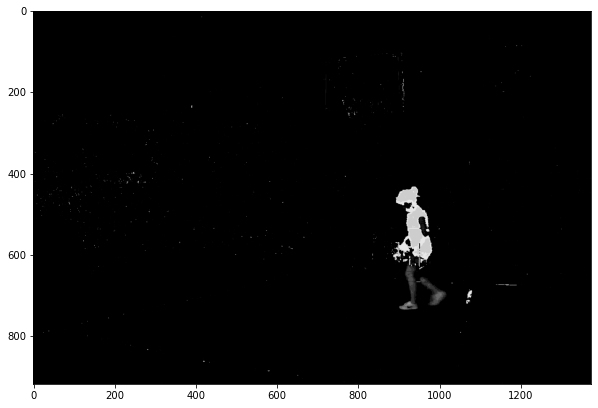

In [53]:
ts = transform(np.array(S_20_zeroed_rounded))
cv2plt(ts)

In [54]:
print("percentage of nonzero pixels: {}%".format(round(nonzero_S_sum/1261332*100,2)))

percentage of nonzero pixels: 1.19%


In [55]:
#num_nonzero entries for estimated matrix S
nonzero_S_sum = cv2.countNonZero(S) 
nonzero_S_sum

133294733

In [56]:
print("percentage of nonzero pixels: {}%".format(round(nonzero_S_sum/(1261332*112)*100,2)))

percentage of nonzero pixels: 94.36%


In [ ]:
imgL_arr = []
imgS_arr = []
for i in range(L.shape[1]):
    arrL = minmaxscale([sub[i] for sub in L])
    imgL = transform(arrL)
    imgL_arr.append(imgL)
    
for i in range(S.shape[1]):
    arrS = minmaxscale([sub[i] for sub in S])
    imgS = transform(arrS)
    imgS_arr.append(imgS)

In [ ]:
from base64 import b64encode
from io import BytesIO
from IPython.display import HTML
from ipywidgets import Video

def makevideo(imgL_array,outputname):
    fourcc = cv2.VideoWriter_fourcc(*'MP4V')
    width, height = imgL_array[0].shape[1], imgL_array[0].shape[0]

    out = cv2.VideoWriter('{}.mp4'.format(outputname),fourcc, 25, (width, height))

    for i in range(len(imgL_array)):
        out.write(imgL_array[i])

    out.release()
    
    video_data = open('{}.mp4'.format(outputname),'rb').read()
    video_url = 'data:video/mp4;base64,' + str(b64encode(video_data).decode())
    return HTML(f'<video controls><source src="{video_url}"></video>')
    #return Video.from_file('{}.mp4'.format(outputname), width=320, height=320)


In [70]:
makevideo(imgL_arr,"L_vid")

In [71]:
makevideo(imgS_arr,"S_vid")